In [1]:
# Обновление окружения:
using Pkg
Pkg.update
# Установка пакетов:
using Pkg
for p in ["CSV", "DataFrames", "RDatasets", "FileIO"]
    Pkg.add(p)
end

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [2]:
using CSV, DataFrames, DelimitedFiles

In [3]:
# Считывание данных и их запись в структуру:
P = CSV.File("programminglanguages.csv") |> DataFrame

Row,year,language
,Int64,String31
1,1951,Regional Assembly Language
2,1952,Autocode
3,1954,IPL
4,1955,FLOW-MATIC
5,1957,FORTRAN
6,1957,COMTRAN
7,1958,LISP
8,1958,ALGOL 58
9,1959,FACT


In [4]:
# Функция определения по названию языка программирования года его создания:
function language_created_year(P,language::String)
    loc = findfirst(P[:,2].==language)
    return P[loc,1]
end

language_created_year (generic function with 1 method)

In [5]:
# Пример вызова функции и определение даты создания языка Python:
print(language_created_year(P,"Python"))
# Пример вызова функции и определение даты создания языка Julia:
language_created_year(P,"Julia")

1991

2012

In [6]:
language_created_year(P,"julia")

LoadError: MethodError: no method matching getindex(::DataFrame, ::Nothing, ::Int64)

[0mClosest candidates are:
[0m  getindex(::DataFrame, [91m::typeof(!)[39m, ::Union{Signed, Unsigned})
[0m[90m   @[39m [36mDataFrames[39m [90mC:\Users\Reachna\.julia\packages\DataFrames\58MUJ\src\dataframe\[39m[90m[4mdataframe.jl:548[24m[39m
[0m  getindex(::DataFrame, [91m::Colon[39m, ::Union{AbstractString, Signed, Symbol, Unsigned})
[0m[90m   @[39m [36mDataFrames[39m [90mC:\Users\Reachna\.julia\packages\DataFrames\58MUJ\src\dataframe\[39m[90m[4mdataframe.jl:542[24m[39m
[0m  getindex(::DataFrame, [91m::InvertedIndex[39m, ::Union{AbstractString, Signed, Symbol, Unsigned})
[0m[90m   @[39m [36mDataFrames[39m [90mC:\Users\Reachna\.julia\packages\DataFrames\58MUJ\src\dataframe\[39m[90m[4mdataframe.jl:538[24m[39m
[0m  ...


In [7]:
# Функция определения по названию языка программирования
# года его создания (без учёта регистра):
function language_created_year_v2(P,language::String)
    loc = findfirst(lowercase.(P[:,2]).==lowercase.(language))
    return P[loc,1]
end

language_created_year_v2 (generic function with 1 method)

In [8]:
# Пример вызова функции и определение даты создания языка julia:
language_created_year_v2(P,"julia")

2012

In [9]:
# Построчное считывание данных с указанием разделителя:
Tx = readdlm("programminglanguages.csv", ',')

74×2 Matrix{Any}:
     "year"  "language"
 1951        "Regional Assembly Language"
 1952        "Autocode"
 1954        "IPL"
 1955        "FLOW-MATIC"
 1957        "FORTRAN"
 1957        "COMTRAN"
 1958        "LISP"
 1958        "ALGOL 58"
 1959        "FACT"
 1959        "COBOL"
 1959        "RPG"
 1962        "APL"
    ⋮        
 2003        "Scala"
 2005        "F#"
 2006        "PowerShell"
 2007        "Clojure"
 2009        "Go"
 2010        "Rust"
 2011        "Dart"
 2011        "Kotlin"
 2011        "Red"
 2011        "Elixir"
 2012        "Julia"
 2014        "Swift"

In [10]:
# Запись данных в CSV-файл:
CSV.write("programming_languages_data2.csv", P)

"programming_languages_data2.csv"

In [11]:
# Пример записи данных в текстовый файл с разделителем ',':
writedlm("programming_languages_data.txt", Tx, ',')

In [12]:
# Пример записи данных в текстовый файл с разделителем '-':
writedlm("programming_languages_data2.txt", Tx, '-')

In [13]:
# Построчное считывание данных с указанием разделителя:
P_new_delim = readdlm("programming_languages_data2.txt", '-')

74×2 Matrix{Any}:
     "year"  "language"
 1951        "Regional Assembly Language"
 1952        "Autocode"
 1954        "IPL"
 1955        "FLOW-MATIC"
 1957        "FORTRAN"
 1957        "COMTRAN"
 1958        "LISP"
 1958        "ALGOL 58"
 1959        "FACT"
 1959        "COBOL"
 1959        "RPG"
 1962        "APL"
    ⋮        
 2003        "Scala"
 2005        "F#"
 2006        "PowerShell"
 2007        "Clojure"
 2009        "Go"
 2010        "Rust"
 2011        "Dart"
 2011        "Kotlin"
 2011        "Red"
 2011        "Elixir"
 2012        "Julia"
 2014        "Swift"

In [14]:
# Инициализация словаря:
dict = Dict{Integer,Vector{String}}()

Dict{Integer, Vector{String}}()

In [15]:
# Инициализация словаря:
dict2 = Dict()

Dict{Any, Any}()

In [16]:
# Заполнение словаря данными:
for i = 1:size(P,1)
    year,lang = P[i,:]
    if year in keys(dict)
        dict[year] = push!(dict[year],lang)
    else
        dict[year] = [lang]
    end
end

In [17]:
# Пример определения в словаре языков программирования, созданных в 2003 году:
dict[2003]

2-element Vector{String}:
 "Groovy"
 "Scala"

In [18]:
# Подгружаем пакет DataFrames:
using DataFrames

In [19]:
# Задаём переменную со структурой DataFrame:
df = DataFrame(year = P[:,1], language = P[:,2])

Row,year,language
,Int64,String31
1,1951,Regional Assembly Language
2,1952,Autocode
3,1954,IPL
4,1955,FLOW-MATIC
5,1957,FORTRAN
6,1957,COMTRAN
7,1958,LISP
8,1958,ALGOL 58
9,1959,FACT


In [20]:
# Вывод всех значения столбца year:
df[!,:year]

73-element Vector{Int64}:
 1951
 1952
 1954
 1955
 1957
 1957
 1958
 1958
 1959
 1959
 1959
 1962
 1962
    ⋮
 2003
 2005
 2006
 2007
 2009
 2010
 2011
 2011
 2011
 2011
 2012
 2014

In [21]:
# Получение статистических сведений о фрейме:
describe(df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,year,1982.99,1951,1986.0,2014,0,Int64
2,language,,ALGOL 58,,dBase III,0,String31


In [22]:
# Подгружаем пакет RDatasets:
using RDatasets
# Задаём структуру данных в виде набора данных:
iris = dataset("datasets", "iris")

Row,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Cat…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa
7,4.6,3.4,1.4,0.3,setosa
8,5.0,3.4,1.5,0.2,setosa
9,4.4,2.9,1.4,0.2,setosa


In [23]:
# Определения типа переменной:
typeof(iris)

DataFrame

In [24]:
describe(iris)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,SepalLength,5.84333,4.3,5.8,7.9,0,Float64
2,SepalWidth,3.05733,2.0,3.0,4.4,0,Float64
3,PetalLength,3.758,1.0,4.35,6.9,0,Float64
4,PetalWidth,1.19933,0.1,1.3,2.5,0,Float64
5,Species,,setosa,,virginica,0,"CategoricalValue{String, UInt8}"


In [25]:
# Отсутствующий тип:
a = missing
typeof(a)

Missing

In [26]:
# Пример операции с переменной отсутствующего типа:
a + 1

missing

In [27]:
# Определение перечня продуктов:
foods = ["apple", "cucumber", "tomato", "banana"]
# Определение калорий:
calories = [missing,47,22,105]

4-element Vector{Union{Missing, Int64}}:
    missing
  47
  22
 105

In [28]:
# Определение типа переменной:
typeof(calories)

Vector{Union{Missing, Int64}} (alias for Array{Union{Missing, Int64}, 1})

In [29]:
# Подключаем пакет Statistics:
using Statistics
# Определение среднего значения:
mean(calories)

missing

In [30]:
# Определение среднего значения без значений с отсутствующим типом:
mean(skipmissing(calories))

58.0

In [31]:
# Задание сведений о ценах:
prices = [0.85,1.6,0.8,0.6]
# Формирование данных о калориях:
dataframe_calories = DataFrame(item=foods,calories=calories)
# Формирование данных о ценах:
dataframe_prices = DataFrame(item=foods,price=prices)
# Объединение данных о калориях и ценах:
DF = innerjoin(dataframe_calories,dataframe_prices,on=:item)

Row,item,calories,price
,String,Int64?,Float64
1,apple,missing,0.85
2,cucumber,47,1.6
3,tomato,22,0.8
4,banana,105,0.6


In [32]:
# Подключаем пакет FileIO:
using FileIO

In [33]:
# Подключаем пакет ImageIO:
import Pkg
Pkg.add("ImageIO")

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [34]:
# Загрузка изображения:
X1 = load("julialogo.png")

460×460 Array{RGBA{N0f8},2} with eltype ColorTypes.RGBA{FixedPointNumbers.N0f8}:
 RGBA{N0f8}(0.0,0.0,0.0,0.0)  …  RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)  …  RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)  …  RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 ⋮                            ⋱  
 RGBA{N0f8}(0.0,0.0,0.0,0.0)     RGBA{N0f8}(0.0,0.0,0.0,0.0)
 RGBA{N0f8}(0.0,0.0,0.0,0.0)   

In [35]:
# Определение типа и размера данных:
@show typeof(X1);
@show size(X1);

typeof(X1) = Matrix{ColorTypes.RGBA{FixedPointNumbers.N0f8}}
size(X1) = (460, 460)


In [36]:
# Загрузка пакетов:
import Pkg
Pkg.add("DataFrames")
Pkg.add("Statistics")
using DataFrames
using CSV
import Pkg
Pkg.add("Plots")

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [37]:
# Загрузка данных:
houses = CSV.File("houses.csv") |> DataFrame

Row,street,city,zip,state,beds,baths,sqft,type,sale_date,price,latitude,longitude
,String,String15,Int64,String3,Int64,Int64,Int64,String15,String31,Int64,Float64,Float64
1,3526 HIGH ST,SACRAMENTO,95838,CA,2,1,836,Residential,Wed May 21 00:00:00 EDT 2008,59222,38.6319,-121.435
2,51 OMAHA CT,SACRAMENTO,95823,CA,3,1,1167,Residential,Wed May 21 00:00:00 EDT 2008,68212,38.4789,-121.431
3,2796 BRANCH ST,SACRAMENTO,95815,CA,2,1,796,Residential,Wed May 21 00:00:00 EDT 2008,68880,38.6183,-121.444
4,2805 JANETTE WAY,SACRAMENTO,95815,CA,2,1,852,Residential,Wed May 21 00:00:00 EDT 2008,69307,38.6168,-121.439
5,6001 MCMAHON DR,SACRAMENTO,95824,CA,2,1,797,Residential,Wed May 21 00:00:00 EDT 2008,81900,38.5195,-121.436
6,5828 PEPPERMILL CT,SACRAMENTO,95841,CA,3,1,1122,Condo,Wed May 21 00:00:00 EDT 2008,89921,38.6626,-121.328
7,6048 OGDEN NASH WAY,SACRAMENTO,95842,CA,3,2,1104,Residential,Wed May 21 00:00:00 EDT 2008,90895,38.6817,-121.352
8,2561 19TH AVE,SACRAMENTO,95820,CA,3,1,1177,Residential,Wed May 21 00:00:00 EDT 2008,91002,38.5351,-121.481
9,11150 TRINITY RIVER DR Unit 114,RANCHO CORDOVA,95670,CA,2,2,941,Condo,Wed May 21 00:00:00 EDT 2008,94905,38.6212,-121.271


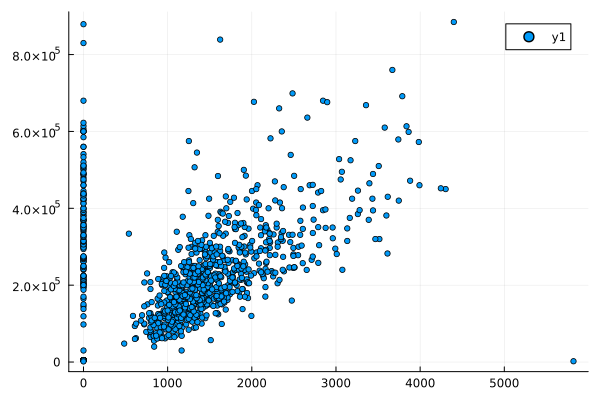

In [38]:
# Построение графика:
using Plots
plot(size=(500,500),leg=false)
x = houses[!,:sqft]
y = houses[!,:price]
scatter(x,y,markersize=3)

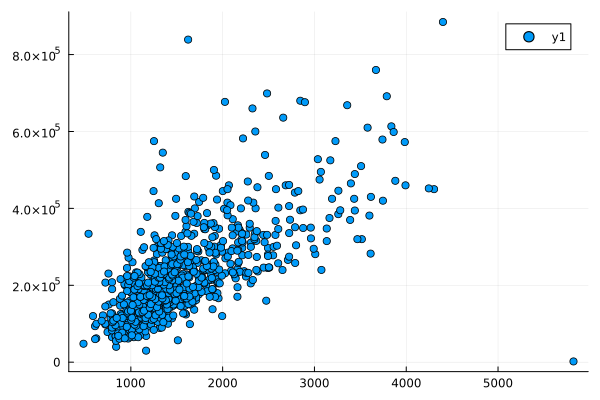

In [39]:
# Фильтрация данных по заданному условию:
filter_houses = houses[houses[!,:sqft].>0,:]
# Построение графика:
x = filter_houses[!,:sqft]
y = filter_houses[!,:price]
scatter(x,y)

In [40]:
# Подключение пакета Statistics:
using Statistics
# Определение средней цены для определённого типа домов:
combine(groupby(filter_houses,:type),filter_houses->mean(filter_houses[!,:price]))

Row,type,x1
,String15,Float64
1,Residential,2.34802e5
2,Condo,1.34213e5
3,Multi-Family,2.24535e5


In [41]:
# Подключение пакета Clustering:
import Pkg
Pkg.add("Clustering")
using Clustering

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [42]:
# Добавление данных :latitude и :longitude в новый фрейм:
X = filter_houses[!, [:latitude,:longitude]]

Row,latitude,longitude
,Float64,Float64
1,38.6319,-121.435
2,38.4789,-121.431
3,38.6183,-121.444
4,38.6168,-121.439
5,38.5195,-121.436
6,38.6626,-121.328
7,38.6817,-121.352
8,38.5351,-121.481
9,38.6212,-121.271


In [43]:
# Конвертация данных в матричный вид:
X = Matrix{Float64}(X)

814×2 Matrix{Float64}:
 38.6319  -121.435
 38.4789  -121.431
 38.6183  -121.444
 38.6168  -121.439
 38.5195  -121.436
 38.6626  -121.328
 38.6817  -121.352
 38.5351  -121.481
 38.6212  -121.271
 38.7009  -121.443
 38.6377  -121.452
 38.4707  -121.459
 38.6187  -121.436
  ⋮       
 38.7035  -121.375
 38.7031  -121.235
 38.3898  -121.446
 38.8978  -121.325
 38.4679  -121.445
 38.4453  -121.442
 38.4174  -121.484
 38.4577  -121.36
 38.4999  -121.459
 38.7088  -121.257
 38.417   -121.397
 38.6552  -121.076

In [44]:
# Транспонирование матрицы с данными:
X = X'

2×814 adjoint(::Matrix{Float64}) with eltype Float64:
   38.6319    38.4789    38.6183  …    38.7088    38.417    38.6552
 -121.435   -121.431   -121.444      -121.257   -121.397  -121.076

In [45]:
# Задание количества кластеров:
k = length(unique(filter_houses[!,:zip]))

66

In [46]:
# Определение k-среднего:
C = kmeans(X,k)

KmeansResult{Matrix{Float64}, Float64, Int64}([38.63384813333333 38.46755533333334 … 38.524875375 38.4712824; -121.53378246666665 -121.31786866666668 … -121.4249398125 -121.4590456], [54, 57, 13, 13, 65, 15, 31, 44, 58, 10  …  27, 22, 57, 33, 56, 48, 63, 9, 14, 16], [7.917070615803823e-5, 0.000155379999341676, 7.903687219368294e-6, 2.1914860553806648e-5, 0.00014646772251580842, 0.00017304826178587973, 0.0001565350394230336, 0.00010155051859328523, 0.00043306466977810487, 0.00011686658399412408  …  5.860410237801261e-5, 5.2413251978578046e-5, 6.081747051212005e-5, 0.00020461086387513205, 0.00013415837747743353, 8.298793545691296e-5, 4.5475157094188035e-5, 0.000179083421244286, 0.0003265923005528748, 7.06132996128872e-5], [15, 3, 9, 3, 13, 6, 3, 9, 11, 13  …  13, 11, 13, 20, 25, 12, 17, 7, 16, 10], [15, 3, 9, 3, 13, 6, 3, 9, 11, 13  …  13, 11, 13, 20, 25, 12, 17, 7, 16, 10], 0.19741556713415775, 21, true)

In [47]:
# Формирование фрейма данных:
df = DataFrame(cluster = C.assignments,city = filter_houses[!,:city],
    latitude = filter_houses[!,:latitude],longitude = filter_houses[!,:longitude],zip = filter_houses[!,:zip])

Row,cluster,city,latitude,longitude,zip
,Int64,String15,Float64,Float64,Int64
1,54,SACRAMENTO,38.6319,-121.435,95838
2,57,SACRAMENTO,38.4789,-121.431,95823
3,13,SACRAMENTO,38.6183,-121.444,95815
4,13,SACRAMENTO,38.6168,-121.439,95815
5,65,SACRAMENTO,38.5195,-121.436,95824
6,15,SACRAMENTO,38.6626,-121.328,95841
7,31,SACRAMENTO,38.6817,-121.352,95842
8,44,SACRAMENTO,38.5351,-121.481,95820
9,58,RANCHO CORDOVA,38.6212,-121.271,95670


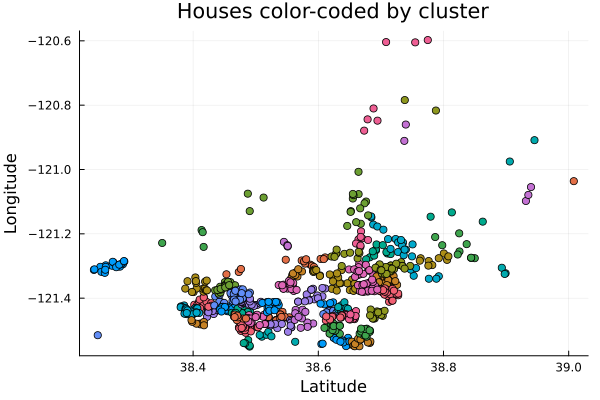

In [48]:
clusters_figure = plot(legend = false)
for i = 1:k
    clustered_houses = df[df[!,:cluster].== i,:]
    xvals = clustered_houses[!,:latitude]
    yvals = clustered_houses[!,:longitude]
    scatter!(clusters_figure,xvals,yvals,markersize=4)
end
xlabel!("Latitude")
ylabel!("Longitude")
title!("Houses color-coded by cluster")
display(clusters_figure)

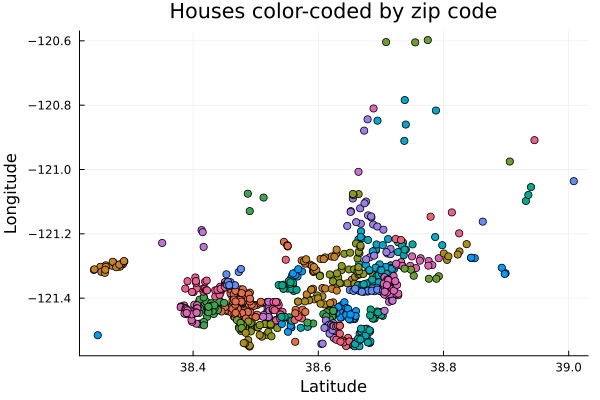

In [49]:
unique_zips = unique(filter_houses[!,:zip])
zips_figure = plot(legend = false)
for uzip in unique_zips
    subs = filter_houses[filter_houses[!,:zip].==uzip,:]
    x = subs[!,:latitude]
    y = subs[!,:longitude]
    scatter!(zips_figure,x,y)
end
xlabel!("Latitude")
ylabel!("Longitude")
title!("Houses color-coded by zip code")
display(zips_figure)

In [50]:
# Подключение пакета NearestNeighbors:
import Pkg
Pkg.add("NearestNeighbors")

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [51]:
using NearestNeighbors
knearest = 10
id = 70
point = X[:,id]

2-element Vector{Float64}:
   38.44004
 -121.421012

In [52]:
# Поиск ближайших соседей:
kdtree = KDTree(X)
idxs, dists = knn(kdtree, point, knearest, true)

([70, 764, 196, 125, 557, 368, 415, 92, 112, 683], [0.0, 0.006264891539364138, 0.00825320259050462, 0.008473585132630057, 0.009164073548370188, 0.009405065124697706, 0.009921759722950759, 0.009941028618812013, 0.010332637707777167, 0.011168993911721985])

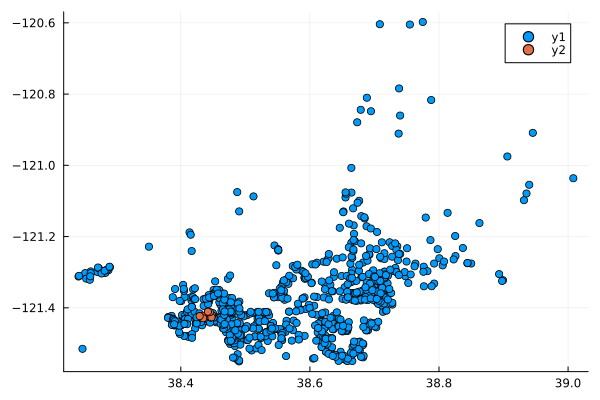

In [53]:
# Все объекты недвижимости:
x = filter_houses[!,:latitude];
y = filter_houses[!,:longitude];
scatter(x,y)
# Соседи:
x = filter_houses[idxs,:latitude];
y = filter_houses[idxs,:longitude];
scatter!(x,y)

In [54]:
# Фильтрация по районам соседних домов:
cities = filter_houses[idxs,:city]

10-element PooledArrays.PooledVector{String15, UInt32, Vector{UInt32}}:
 "SACRAMENTO"
 "ELK GROVE"
 "SACRAMENTO"
 "SACRAMENTO"
 "SACRAMENTO"
 "SACRAMENTO"
 "ELK GROVE"
 "ELK GROVE"
 "ELK GROVE"
 "ELK GROVE"

In [55]:
# Фрейм с указанием площади и цены недвижимости:
F = filter_houses[!, [:sqft,:price]]

Row,sqft,price
,Int64,Int64
1,836,59222
2,1167,68212
3,796,68880
4,852,69307
5,797,81900
6,1122,89921
7,1104,90895
8,1177,91002
9,941,94905


In [56]:
# Конвертация данных в массив:
F = Matrix{Float64}(F)'

2×814 adjoint(::Matrix{Float64}) with eltype Float64:
   836.0   1167.0    796.0    852.0    797.0  …    1216.0    1685.0    1362.0
 59222.0  68212.0  68880.0  69307.0  81900.0     235000.0  235301.0  235738.0

In [57]:
# Подключение пакета MultivariateStats:
import Pkg
Pkg.add("MultivariateStats")

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [58]:
using MultivariateStats
# Приведение типов данных к распределению для PCA:
M = fit(PCA, F)

PCA(indim = 2, outdim = 1, principalratio = 0.9999840784692097)

Pattern matrix (unstandardized loadings):
──────────────
           PC1
──────────────
1  460.52
2    1.19826e5
──────────────

Importance of components:
─────────────────────────────────────
                                  PC1
─────────────────────────────────────
SS Loadings (Eigenvalues)  1.43584e10
Variance explained         0.999984
Cumulative variance        0.999984
Proportion explained       1.0
Cumulative proportion      1.0
─────────────────────────────────────

In [59]:
# Выделение значений главных компонент в отдельную переменную:
y = MultivariateStats.transform(M, F)

Xr = reconstruct(M, y)

2×814 Matrix{Float64}:
   936.922    971.477    974.039    975.681  …  1613.64         1615.32
 59221.6    68212.8    68879.3    69306.5          2.35301e5  235737.0

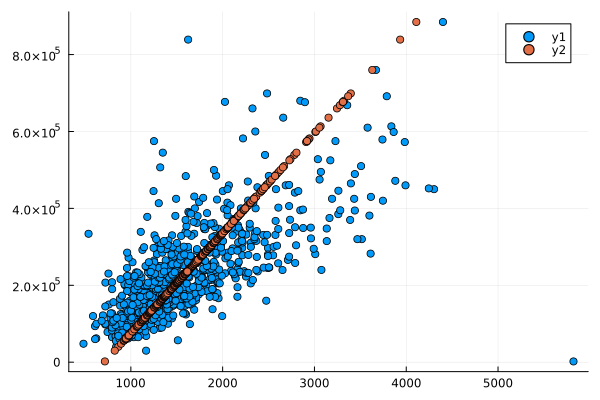

In [60]:
# Построение графика с выделением главных компонент:
scatter(F[1,:],F[2,:])
scatter!(Xr[1,:],Xr[2,:])

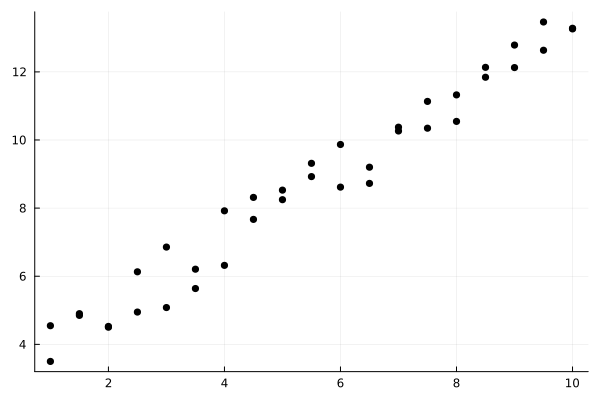

In [61]:
xvals = repeat(1:0.5:10,inner=2)
yvals = 3 .+ xvals + 2*rand(length(xvals)) .- 1
scatter(xvals,yvals,color=:black,leg=false)

In [62]:
function find_best_fit(xvals,yvals)
    meanx = mean(xvals)
    meany = mean(yvals)
    stdx = std(xvals)
    stdy = std(yvals)
    r = cor(xvals,yvals)
    a = r*stdy/stdx
    b = meany - a*meanx
    return a,b
end

find_best_fit (generic function with 1 method)

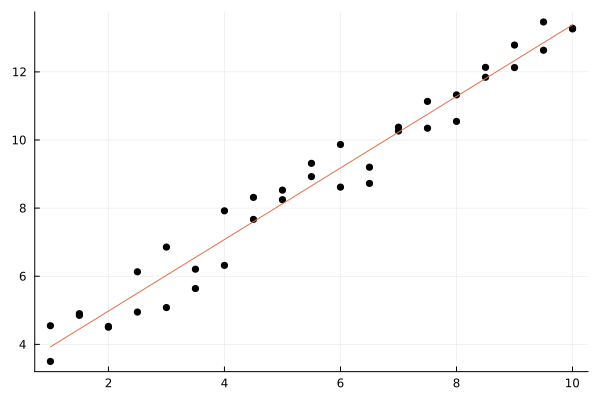

In [63]:
a,b = find_best_fit(xvals,yvals)
ynew = a * xvals .+ b
plot!(xvals,ynew)

In [64]:
xvals = 1:100000;
xvals = repeat(xvals,inner=3);
yvals = 3 .+ xvals + 2*rand(length(xvals)) .- 1;

In [65]:
@show size(xvals)
@show size(yvals)

size(xvals) = (300000,)
size(yvals) = (300000,)


(300000,)

In [66]:
@time a,b = find_best_fit(xvals,yvals)

  0.034630 seconds (23.13 k allocations: 1.506 MiB, 95.08% compilation time)


(1.000000022488431, 2.9988226057685097)

In [67]:
import Pkg
Pkg.add("PyCall")
Pkg.add("Conda")
using PyCall
using Conda

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [68]:
py"""
import numpy
def find_best_fit_python(xvals,yvals):
    meanx = numpy.mean(xvals)
    meany = numpy.mean(yvals)
    stdx = numpy.std(xvals)
    stdy = numpy.std(yvals)
    r = numpy.corrcoef(xvals,yvals)[0][1]
    a = r*stdy/stdx
    b = meany - a*meanx
    return a,b
"""

In [69]:
find_best_fit_python = py"find_best_fit_python"

PyObject <function find_best_fit_python at 0x000001AD8A4901F0>

In [70]:
xpy = PyObject(xvals)
ypy = PyObject(yvals)
@time a,b = find_best_fit_python(xpy,ypy)

  0.132207 seconds (73.55 k allocations: 5.060 MiB, 75.61% compilation time)


(1.00000002248843, 2.9988226057903375)

In [71]:
import Pkg
Pkg.add("BenchmarkTools")
using BenchmarkTools

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [72]:
@btime a,b = find_best_fit_python(xvals,yvals)
@btime a,b = find_best_fit(xvals,yvals)

  7.022 ms (27 allocations: 864 bytes)
  1.103 ms (1 allocation: 32 bytes)


(1.000000022488431, 2.9988226057685097)

##  Задания для самостоятельного выполнения

###  Кластеризация

In [73]:
using RDatasets
iris = dataset("datasets", "iris")

Row,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Cat…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa
7,4.6,3.4,1.4,0.3,setosa
8,5.0,3.4,1.5,0.2,setosa
9,4.4,2.9,1.4,0.2,setosa


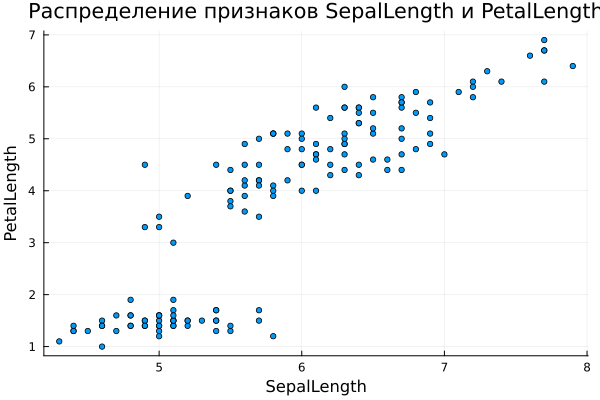

In [74]:
plot(size=(600, 600), leg=false)

x = iris[!, :SepalLength]
y = iris[!, :PetalLength]
scatter(x, y, markersize=3, title="Распределение признаков SepalLength и PetalLength",
    xlabel="SepalLength", ylabel="PetalLength", leg=false)

In [75]:
X = iris[!, [:SepalLength, :PetalLength]]

Row,SepalLength,PetalLength
,Float64,Float64
1,5.1,1.4
2,4.9,1.4
3,4.7,1.3
4,4.6,1.5
5,5.0,1.4
6,5.4,1.7
7,4.6,1.4
8,5.0,1.5
9,4.4,1.4


In [76]:
X = Matrix(iris[!, [:SepalLength, :PetalLength]])

150×2 Matrix{Float64}:
 5.1  1.4
 4.9  1.4
 4.7  1.3
 4.6  1.5
 5.0  1.4
 5.4  1.7
 4.6  1.4
 5.0  1.5
 4.4  1.4
 4.9  1.5
 5.4  1.5
 4.8  1.6
 4.8  1.4
 ⋮    
 6.0  4.8
 6.9  5.4
 6.7  5.6
 6.9  5.1
 5.8  5.1
 6.8  5.9
 6.7  5.7
 6.7  5.2
 6.3  5.0
 6.5  5.2
 6.2  5.4
 5.9  5.1

In [77]:
# Транспонирование матрицы с данными:
X = X'

2×150 adjoint(::Matrix{Float64}) with eltype Float64:
 5.1  4.9  4.7  4.6  5.0  5.4  4.6  5.0  …  6.8  6.7  6.7  6.3  6.5  6.2  5.9
 1.4  1.4  1.3  1.5  1.4  1.7  1.4  1.5     5.9  5.7  5.2  5.0  5.2  5.4  5.1

In [78]:
k = length(unique(iris[!, :Species]))

3

In [79]:
C = kmeans(X,k)

KmeansResult{Matrix{Float64}, Float64, Int64}([5.874137931034483 5.007843137254902 6.839024390243902; 4.393103448275863 1.4921568627450983 5.678048780487804], [2, 2, 2, 2, 2, 2, 2, 2, 2, 2  …  3, 3, 1, 3, 3, 3, 1, 3, 3, 1], [0.016985774702035883, 0.02012302960400092, 0.13169165705497932, 0.16639753940791735, 0.008554402153016838, 0.1969857747020427, 0.1748289119569364, 0.00012302960399779295, 0.37796616685889717, 0.011691657054981874  …  0.0254193932183, 0.33785841760854396, 0.5051991676575369, 0.05078524687684194, 0.019809637120715706, 0.24785841760854055, 0.5496819262782395, 0.34346817370612825, 0.48566329565733213, 0.5003715814506506], [58, 51, 41], [58, 51, 41], 53.80997864410625, 10, true)

In [80]:
iris_new = DataFrame(cluster = C.assignments,
    SepalLength=iris[!, :SepalLength], PetalLength=iris[!, :PetalLength], Spicies = iris[!, :Species])

Row,cluster,SepalLength,PetalLength,Spicies
,Int64,Float64,Float64,Cat…
1,2,5.1,1.4,setosa
2,2,4.9,1.4,setosa
3,2,4.7,1.3,setosa
4,2,4.6,1.5,setosa
5,2,5.0,1.4,setosa
6,2,5.4,1.7,setosa
7,2,4.6,1.4,setosa
8,2,5.0,1.5,setosa
9,2,4.4,1.4,setosa


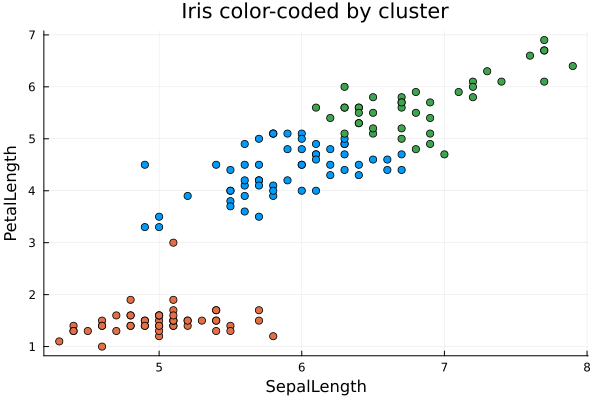

In [81]:
cluster_figure = plot(legend = false)
for i = 1:k
    iris_new_clustered = iris_new[iris_new[!, :cluster].==i,:]
    xvals = iris_new_clustered[!, :SepalLength]
    yvals = iris_new_clustered[!, :PetalLength]
    scatter!(cluster_figure, xvals, yvals, markersize=4)
end
xlabel!("SepalLength")
ylabel!("PetalLength")
title!("Iris color-coded by cluster")
display(cluster_figure)

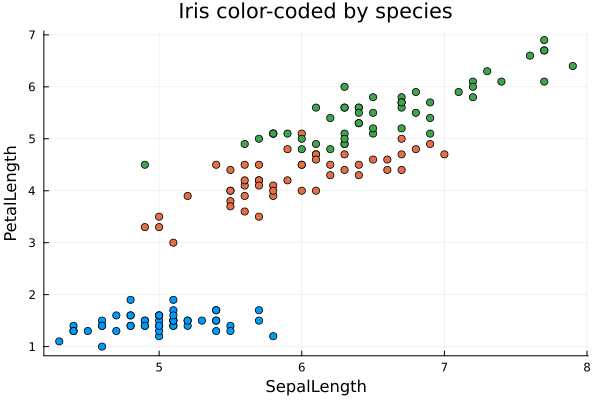

In [82]:
unique_species = unique(iris[!, :Species])
species_figure = plot(legend=false)
for uspecies in unique_species
    iris_sp = iris[iris[!, :Species].==uspecies,:]
    x = iris_sp[!, :SepalLength]
    y = iris_sp[!, :PetalLength]
    scatter!(species_figure, x, y)
end
xlabel!("SepalLength")
ylabel!("PetalLength")
title!("Iris color-coded by species")
display(species_figure)

### Регрессия (метод наименьших квадратов в случае линейной регрессии)

In [83]:
# Часть 1
X = randn(1000, 3)
a0 = rand(3)
print(a0)
y = X * a0 + 0.1 * randn(1000);

[0.2756963061990987, 0.11064418518813057, 0.6420620293621074]

In [84]:
function linear_regression_model(X,y)
    X2 = ones(1000)
    X = hcat(X,X2)
    return X \ y
end

linear_regression_model (generic function with 1 method)

In [85]:
a = linear_regression_model(X,y)
print(a)

[0.27186121611415687, 0.11565127842117802, 0.6453067691942215, -0.0006286184372975464]

In [86]:
using MultivariateStats
# using llsq
a = llsq(X,y)
print(a)

[0.2718612161141568, 0.11565127842117806, 0.6453067691942221, -0.0006286184372975258]

In [87]:
Pkg.add("GLM")

   Resolving package versions...
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\Reachna\.julia\environments\v1.9\Manifest.toml`


In [88]:
using GLM, DataFrames

In [89]:
X1 = X[:, 1]
X2 = X[:, 2]
X3 = X[:, 3]

data = DataFrame(y=y, x1=X1, x2=X2, x3=X3);

lm(@formula(y ~ x1 + x2 + x3), data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y ~ 1 + x1 + x2 + x3

Coefficients:
────────────────────────────────────────────────────────────────────────────────
                    Coef.  Std. Error       t  Pr(>|t|)    Lower 95%   Upper 95%
────────────────────────────────────────────────────────────────────────────────
(Intercept)  -0.000628618  0.00316643   -0.20    0.8427  -0.00684225  0.00558501
x1            0.271861     0.00313727   86.66    <1e-99   0.265705    0.278018
x2            0.115651     0.00324786   35.61    <1e-99   0.109278    0.122025
x3            0.645307     0.00330034  195.53    <1e-99   0.63883     0.651783
────────────────────────────────────────────────────────────────────────────────

In [90]:
# Часть 2
X = rand(100);
y = 2X + 0.1 * randn(100);

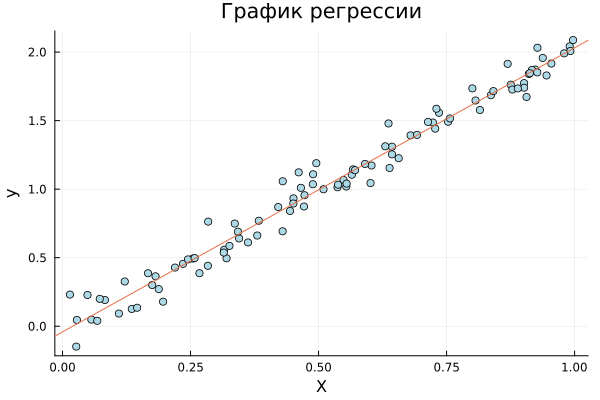

In [91]:
a, b = find_best_fit(X,y)
ynew = a * X .+ b
scatter(X, y, title="График регрессии", xlabel="X", ylabel="y", color=:lightblue, leg=false, line=:scatter)
Plots.abline!(a, b, line=:solid)

###  Модель ценообразования биномиальных опционов

In [92]:
S = 100
T = 1
n = 10000
sigma = 0.3
r = 0.08

h = T / n # длина одного периода;
u = exp(r*h + sigma * sqrt(h))
d = exp(r*h - sigma * sqrt(h))
p = (exp(r*h) - d)/(u - d)

j = 0
stockTree = []
append!(stockTree, S)
for i in 1:n
    k = rand()
    if k < p
        append!(stockTree, S * (u^(i - j)) * (d ^ j))
    else
        j = j + 1
        append!(stockTree, S * (u^(i - j)) * (d ^ j))
    end
end

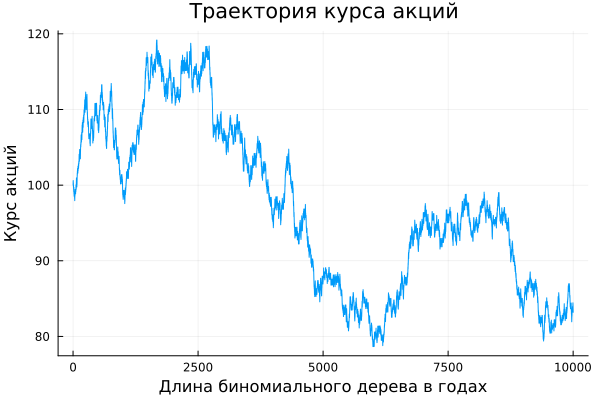

In [93]:
using Plots
plot(stockTree, title="Траектория курса акций", xlabel="Длина биномиального дерева в годах",
    ylabel="Курс акций", leg=false)

In [94]:
function createPath(S::Float64, T::Float64, n::Int64, sigma::Float64, r::Float64) 
    # S - начальная цена акции;
    # T - длина биномиального дерева в годах;
    # n - длина одного периода;
    # sigma - волатильность акции;
    # 𝑟 — годовая процентная ставка;
    
    h = T / n # длина одного периода;
    u = exp(r*h + sigma * sqrt(h))
    d = exp(r*h - sigma * sqrt(h))
    p = (exp(r*h) - d)/(u - d)
    stockTree = []
    append!(stockTree, S)
    j = 0

    for i in 1:n
        k = rand()
        if k < p
            append!(stockTree, S * (u^(i - j)) * (d ^ j))
        else
            j = j + 1
            append!(stockTree, S * (u^(i - j)) * (d ^ j))
        end
    end
    return stockTree
end

createPath (generic function with 1 method)

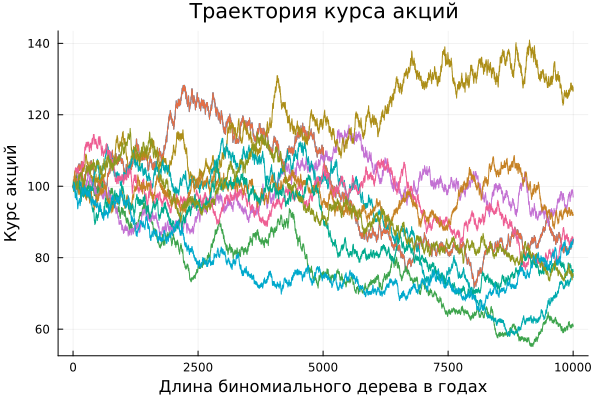

In [95]:
for i in 1:10
    IJulia.clear_output(true)
    traj = createPath(100.0, 1.0, 10000, 0.3, 0.08)
    if i == 1
        p = plot(traj, title="Траектория курса акций", xlabel="Длина биномиального дерева в годах",
            ylabel="Курс акций", leg=false)
    end
    p = plot!(traj)
    display(p)
end

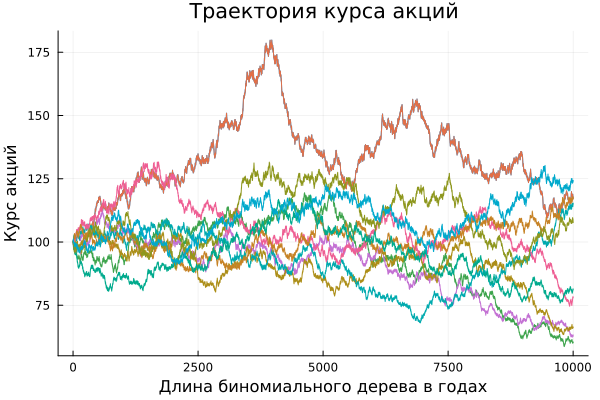

In [96]:
using Base.Threads
Threads.@threads for i in 1:10
    IJulia.clear_output(true)
    traj = createPath(100.0, 1.0, 10000, 0.3, 0.08)
    if i == 1
        g = plot(traj, title="Траектория курса акций", xlabel="Длина биномиального дерева в годах",
            ylabel="Курс акций", leg=false)
    end
    g = plot!(traj)
    display(g)
end